In [1]:
import pandas as pd


df = pd.read_csv('nypd-shooting-incident-data-historic-1.csv')
print(df.head())

   INCIDENT_KEY              OCCUR_DATE OCCUR_TIME       BORO  PRECINCT  \
0     173129246  12/31/2017 12:00:00 AM   18:02:00   BROOKLYN        61   
1     173120488  12/31/2017 12:00:00 AM   05:30:00   BROOKLYN        94   
2     173120488  12/31/2017 12:00:00 AM   05:30:00   BROOKLYN        94   
3     173105454  12/29/2017 12:00:00 AM   22:20:00      BRONX        41   
4     173084537  12/29/2017 12:00:00 AM   15:53:00  MANHATTAN        33   

   JURISDICTION_CODE LOCATION_DESC  STATISTICAL_MURDER_FLAG PERP_AGE_GROUP  \
0                  0           NaN                    False            <18   
1                  0           NaN                    False            NaN   
2                  0           NaN                    False            NaN   
3                  0           NaN                     True            NaN   
4                  0           NaN                    False          18-24   

  PERP_SEX       PERP_RACE VIC_AGE_GROUP VIC_SEX VIC_RACE  X_COORD_CD  \
0      

In [2]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6407 entries, 0 to 6406
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   INCIDENT_KEY             6407 non-null   int64  
 1   OCCUR_DATE               6407 non-null   object 
 2   OCCUR_TIME               6407 non-null   object 
 3   BORO                     6407 non-null   object 
 4   PRECINCT                 6407 non-null   int64  
 5   JURISDICTION_CODE        6407 non-null   int64  
 6   LOCATION_DESC            2167 non-null   object 
 7   STATISTICAL_MURDER_FLAG  6407 non-null   bool   
 8   PERP_AGE_GROUP           3379 non-null   object 
 9   PERP_SEX                 3379 non-null   object 
 10  PERP_RACE                3379 non-null   object 
 11  VIC_AGE_GROUP            6407 non-null   object 
 12  VIC_SEX                  6407 non-null   object 
 13  VIC_RACE                 6407 non-null   object 
 14  X_COORD_CD              

In [3]:
print(df.describe())

       INCIDENT_KEY     PRECINCT  JURISDICTION_CODE    X_COORD_CD  \
count  6.407000e+03  6407.000000        6407.000000  6.407000e+03   
mean   1.352651e+08    66.690339           0.351178  1.008757e+06   
std    2.681731e+07    27.096547           0.759152  1.885888e+04   
min    8.835462e+07     1.000000           0.000000  9.228840e+05   
25%    1.093410e+08    44.000000           0.000000  9.999705e+05   
50%    1.426794e+08    69.000000           0.000000  1.007605e+06   
75%    1.548519e+08    81.000000           0.000000  1.016320e+06   
max    1.731292e+08   123.000000           2.000000  1.063056e+06   

          Y_COORD_CD     Latitude    Longitude  
count    6407.000000  6407.000000  6407.000000  
mean   206794.690495    40.734234   -73.911555  
std     32373.726110     0.088863     0.068003  
min    132099.000000    40.529107   -74.220783  
25%    181481.000000    40.664760   -73.943258  
50%    193359.000000    40.697379   -73.915727  
75%    239453.000000    40.823884  

In [4]:
df['OCCUR_DATE'] = pd.to_datetime(df['OCCUR_DATE'])
df['OCCUR_TIME'] = pd.to_datetime(df['OCCUR_TIME'], format='%H:%M:%S').dt.time

df['OCCUR_DATETIME'] = pd.to_datetime(df['OCCUR_DATE'].dt.date.astype(str) + ' ' + df['OCCUR_TIME'].astype(str))

df.set_index('OCCUR_DATETIME', inplace=True)
monthly_incidents = df.resample('M').size()

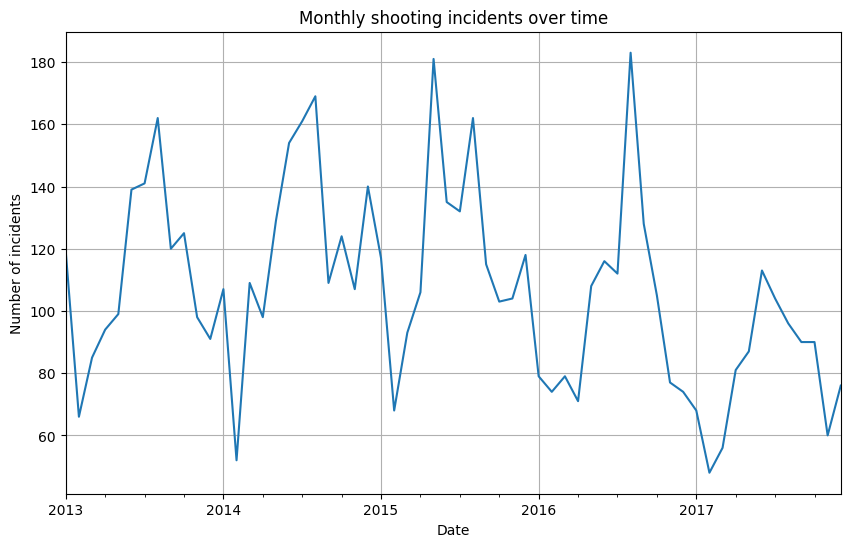

In [5]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
monthly_incidents.plot()
plt.title('Monthly shooting incidents over time')
plt.xlabel('Date')
plt.ylabel('Number of incidents')
plt.grid(True)
plt.show()

In [6]:
import folium

In [7]:
map_nyc = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

In [8]:
for index, row in df.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']],
                  popup=f"Date: {index.strftime('%Y-%m-%d')}, Time: {index.strftime('%H:%M:%S')}, Borough: {row['BORO']}",
                  icon=folium.Icon(color='red', icon='info-sign')
                 ).add_to(map_nyc)

In [9]:
map_nyc

In [10]:
import numpy as np

In [11]:
perp_age_distribution = df['PERP_AGE_GROUP'].value_counts()
perp_sex_distribution = df['PERP_SEX'].value_counts()
perp_race_distribution = df['PERP_RACE'].value_counts()

In [12]:
vic_age_distribution = df['VIC_AGE_GROUP'].value_counts()
vic_sex_distribution = df['VIC_SEX'].value_counts()
vic_race_distribution = df['VIC_RACE'].value_counts()

In [13]:
print("Demographics of perpetrators:")
print("Age group distribution:")
print(perp_age_distribution)
print("\nSex Distribution:")
print(perp_sex_distribution)
print("\nRace Distribution:")
print(perp_race_distribution)

print("\nDemographics of victims:")
print("Age group distribution:")
print(vic_age_distribution)
print("\nSex Distribution:")
print(vic_sex_distribution)
print("\nRace Distribution:")
print(vic_race_distribution)

Demographics of perpetrators:
Age group distribution:
18-24      1490
25-44      1374
<18         319
45-64       130
UNKNOWN      44
65+          20
1020          1
940           1
Name: PERP_AGE_GROUP, dtype: int64

Sex Distribution:
M    3263
F      97
U      19
Name: PERP_SEX, dtype: int64

Race Distribution:
BLACK                             2415
WHITE HISPANIC                     506
BLACK HISPANIC                     304
WHITE                               65
UNKNOWN                             53
ASIAN / PACIFIC ISLANDER            35
AMERICAN INDIAN/ALASKAN NATIVE       1
Name: PERP_RACE, dtype: int64

Demographics of victims:
Age group distribution:
25-44      2847
18-24      2463
<18         556
45-64       470
65+          43
UNKNOWN      28
Name: VIC_AGE_GROUP, dtype: int64

Sex Distribution:
M    5831
F     573
U       3
Name: VIC_SEX, dtype: int64

Race Distribution:
BLACK                             4623
WHITE HISPANIC                     842
BLACK HISPANIC             

In [19]:
from pyspark.sql import SparkSession

In [20]:
spark = SparkSession.builder \
    .appName("NY shooting") \
    .getOrCreate()

In [21]:
spark_df = spark.read.csv('nypd-shooting-incident-data-historic-1.csv', header=True, inferSchema=True)
spark_df.createOrReplaceTempView("shooting_incidents")

In [22]:
total_incidents = spark.sql("SELECT COUNT(*) AS total_incidents FROM shooting_incidents").show()

+---------------+
|total_incidents|
+---------------+
|           6407|
+---------------+



In [23]:
incidents_by_borough = spark.sql("SELECT BORO, COUNT(*) AS num_incidents FROM shooting_incidents GROUP BY BORO").show()

+-------------+-------------+
|         BORO|num_incidents|
+-------------+-------------+
|       QUEENS|          943|
|     BROOKLYN|         2646|
|        BRONX|         1838|
|    MANHATTAN|          745|
|STATEN ISLAND|          235|
+-------------+-------------+



In [24]:
avg_latitude_longitude = spark.sql("SELECT AVG(Latitude) AS avg_latitude, AVG(Longitude) AS avg_longitude FROM shooting_incidents").show()

+------------------+------------------+
|      avg_latitude|     avg_longitude|
+------------------+------------------+
|40.734233934218935|-73.91155470564206|
+------------------+------------------+



In [52]:
date_count_rdd = spark_df.rdd.map(lambda row: (row['OCCUR_DATE'], 1))

In [53]:
daily_incident_count_rdd = date_count_rdd.reduceByKey(lambda x, y: x + y)

In [55]:
max_incidents_day = daily_incident_count_rdd.max(lambda x: x[1])

print("Maximum number of shooting incidents in a single day:")
print("Date:", max_incidents_day[0])
print("Number of incidents:", max_incidents_day[1])

Maximum number of shooting incidents in a single day:
Date: 07/20/2013 12:00:00 AM
Number of incidents: 19


In [58]:
import matplotlib.dates as mdates
from datetime import datetime

In [59]:
date_count_rdd = spark_df.rdd.map(lambda row: (row['OCCUR_DATE'], 1))
daily_incident_count_rdd = date_count_rdd.reduceByKey(lambda x, y: x + y)
max_incidents_day = daily_incident_count_rdd.max(lambda x: x[1])

In [62]:
dates, counts = zip(*daily_incident_count_rdd.collect())
dates = [datetime.strptime(str(date), '%m/%d/%Y %I:%M:%S %p') for date in dates]

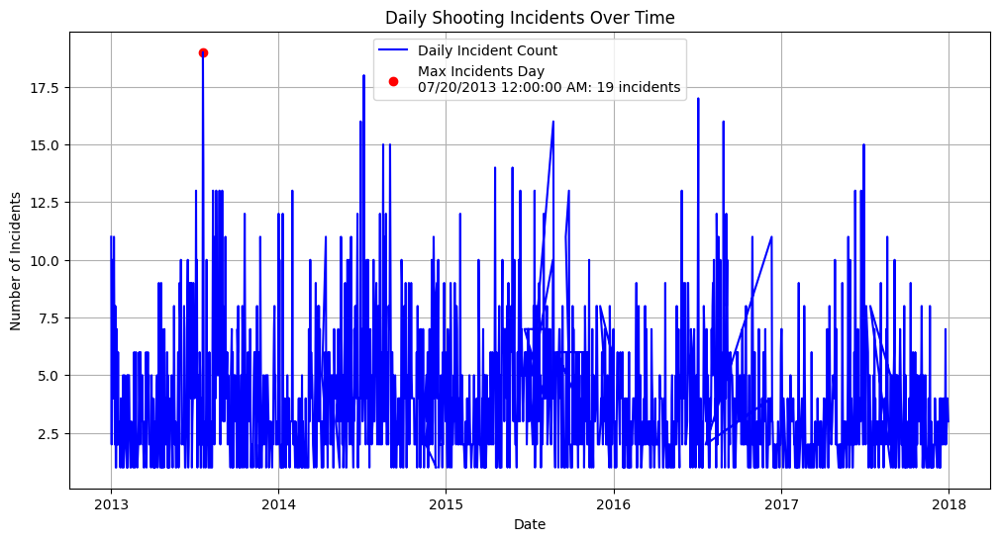

In [63]:
plt.figure(figsize=(12, 6))
plt.plot(dates, counts, label='Daily Incident Count', color='blue')
plt.scatter([datetime.strptime(str(max_incidents_day[0]), '%m/%d/%Y %I:%M:%S %p')], [max_incidents_day[1]],
            color='red', label=f'Max Incidents Day\n{max_incidents_day[0]}: {max_incidents_day[1]} incidents')
plt.title('Daily Shooting Incidents Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Incidents')
plt.legend()
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.grid(True)
plt.show()